In [1]:
from __future__ import print_function

import mxnet as mx
from mxnet import gluon

from matplotlib import pyplot as plt
import numpy as np

gradcam_file = "gradcam.py" 
base_url = "https://raw.githubusercontent.com/apache/incubator-mxnet/master/docs/tutorial_utils/vision/cnn_visualization/{}?raw=true"
mx.test_utils.download(base_url.format(gradcam_file), fname=gradcam_file)
import gradcam

## Here we are applying Grad-CAM

Gradient-weighted Class Activation Mapping 

In [2]:
import os
from mxnet.gluon.model_zoo import model_store

from mxnet.initializer import Xavier
from mxnet.gluon.nn import MaxPool2D, Flatten, Dense, Dropout, BatchNorm
from gradcam import Activation, Conv2D

class VGG(mx.gluon.HybridBlock):
    def __init__(self, layers, filters, classes=1000, **kwargs):
        super(VGG, self).__init__(**kwargs)
        assert len(layers) == len(filters)
        with self.name_scope():
            self.features = self._make_features(layers, filters)
            self.features.add(Dense(4096, activation='relu',
                                       weight_initializer='normal',
                                       bias_initializer='zeros'))
            self.features.add(Dropout(rate=0.5))
            self.features.add(Dense(4096, activation='relu',
                                       weight_initializer='normal',
                                       bias_initializer='zeros'))
            self.features.add(Dropout(rate=0.5))
            self.output = Dense(classes,
                                   weight_initializer='normal',
                                   bias_initializer='zeros')

    def _make_features(self, layers, filters):
        featurizer = mx.gluon.nn.HybridSequential(prefix='')
        for i, num in enumerate(layers):
            for _ in range(num):
                featurizer.add(Conv2D(filters[i], kernel_size=3, padding=1,
                                         weight_initializer=Xavier(rnd_type='gaussian',
                                                                   factor_type='out',
                                                                   magnitude=2),
                                         bias_initializer='zeros'))
                featurizer.add(Activation('relu'))
            featurizer.add(MaxPool2D(strides=2))
        return featurizer

    def hybrid_forward(self, F, x):
        x = self.features(x)
        x = self.output(x)
        return x

In [3]:
vgg_spec = {11: ([1, 1, 2, 2, 2], [64, 128, 256, 512, 512]),
            13: ([2, 2, 2, 2, 2], [64, 128, 256, 512, 512]),
            16: ([2, 2, 3, 3, 3], [64, 128, 256, 512, 512]),
            19: ([2, 2, 4, 4, 4], [64, 128, 256, 512, 512])}

def get_vgg(num_layers, ctx=mx.cpu(), root=os.path.join('~', '.mxnet', 'models'), **kwargs):

    # Get the number of convolution layers and filters
    layers, filters = vgg_spec[num_layers]

    # Build the modified VGG network
    net = VGG(layers, filters, **kwargs)
    net.initialize(ctx=ctx)
    
    # Get the pretrained model
    vgg = mx.gluon.model_zoo.vision.get_vgg(num_layers, pretrained=True, ctx=ctx)
    
    # Set the parameters in the new network
    params = vgg.collect_params()
    for key in params:
        param = params[key]
        net.collect_params()[net.prefix+key.replace(vgg.prefix, '')].set_data(param.data())

    return net

def vgg16(**kwargs):
    return get_vgg(16, **kwargs)

In [4]:
image_sz = (224, 224)

def preprocess(data):
    data = mx.image.imresize(data, image_sz[0], image_sz[1])
    data = data.astype(np.float32)
    data = data/255
    data = mx.image.color_normalize(data,
                                    mean=mx.nd.array([0.485, 0.456, 0.406]),
                                    std=mx.nd.array([0.229, 0.224, 0.225]))
    data = mx.nd.transpose(data, (2,0,1))
    return data

network = vgg16(ctx=mx.cpu())

def show_images(pred_str, images):
    titles = [pred_str, 'Grad-CAM', 'Guided Grad-CAM', 'Saliency Map']
    num_images = len(images)
    fig=plt.figure(figsize=(30,30))
    rows, cols = 1, num_images
    for i in range(num_images):
        if i < 2:
            fig.add_subplot(2, cols, i+2)
        else:
            fig.add_subplot(rows, cols, i)
        plt.xlabel(titles[i])
        img = images[i].astype(np.uint8)
        plt.imshow(img, cmap='gray' if i==num_images-1 else None)
    plt.show()

In [5]:
synset_url = "http://data.mxnet.io/models/imagenet/synset.txt"
synset_file_name = "synset.txt"
mx.test_utils.download(synset_url, fname=synset_file_name)
synset = []
with open('synset.txt', 'r') as f:
    synset = [l.rstrip().split(' ', 1)[1].split(',')[0] for l in f]
    
def get_class_name(cls_id):
    return "%s (%d)" % (synset[cls_id], cls_id)

def run_inference(net, data):
    out = net(data)
    return out.argmax(axis=1).asnumpy()[0].astype(int)

In [6]:
def visualize(net, img_path, conv_layer_name):
    orig_img = mx.img.imread(img_path)
    preprocessed_img = preprocess(orig_img)
    preprocessed_img = preprocessed_img.expand_dims(axis=0)
    
    pred_str = get_class_name(run_inference(net, preprocessed_img))
    
    orig_img = mx.image.imresize(orig_img, image_sz[0], image_sz[1]).asnumpy()
    vizs = gradcam.visualize(net, preprocessed_img, orig_img, conv_layer_name)
    return (pred_str, (orig_img, *vizs))

In [7]:
network.features

HybridSequential(
  (0): Conv2D(
    (conv): Conv2D(3 -> 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (1): Activation(
  
  )
  (2): Conv2D(
    (conv): Conv2D(64 -> 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (3): Activation(
  
  )
  (4): MaxPool2D(size=(2, 2), stride=(2, 2), padding=(0, 0), ceil_mode=False)
  (5): Conv2D(
    (conv): Conv2D(64 -> 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (6): Activation(
  
  )
  (7): Conv2D(
    (conv): Conv2D(128 -> 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (8): Activation(
  
  )
  (9): MaxPool2D(size=(2, 2), stride=(2, 2), padding=(0, 0), ceil_mode=False)
  (10): Conv2D(
    (conv): Conv2D(128 -> 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (11): Activation(
  
  )
  (12): Conv2D(
    (conv): Conv2D(256 -> 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (13): Activation(
  
  )
  (14): Conv2D(
    (conv): Conv2D(256 -> 256, kernel_size=(3, 3),

**Showing the First Layer's visualizations**

vgg0_conv2d0


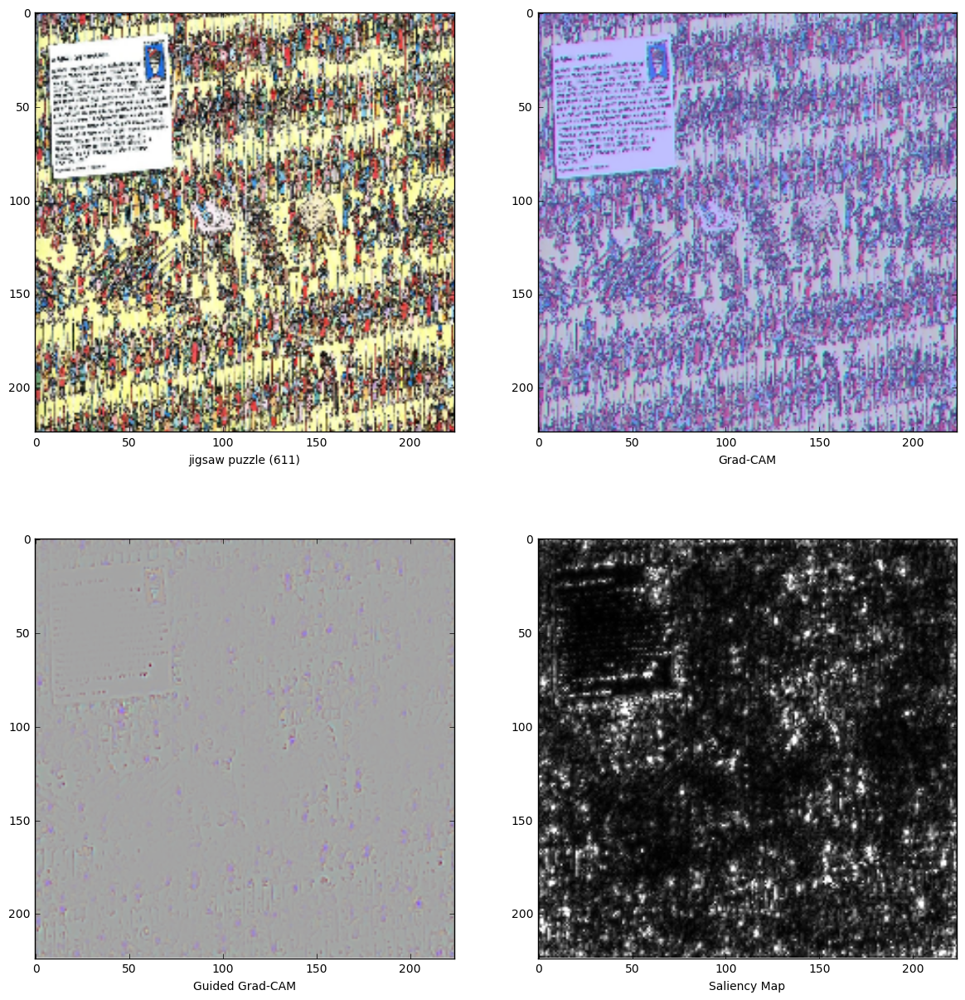

In [8]:
layer = network.features[0]._name
print(layer)
show_images(*visualize(network, "Deep-Waldo/data/original/10.jpg", layer))

**Showing the Middle Layer's visualizations**

vgg0_conv2d6


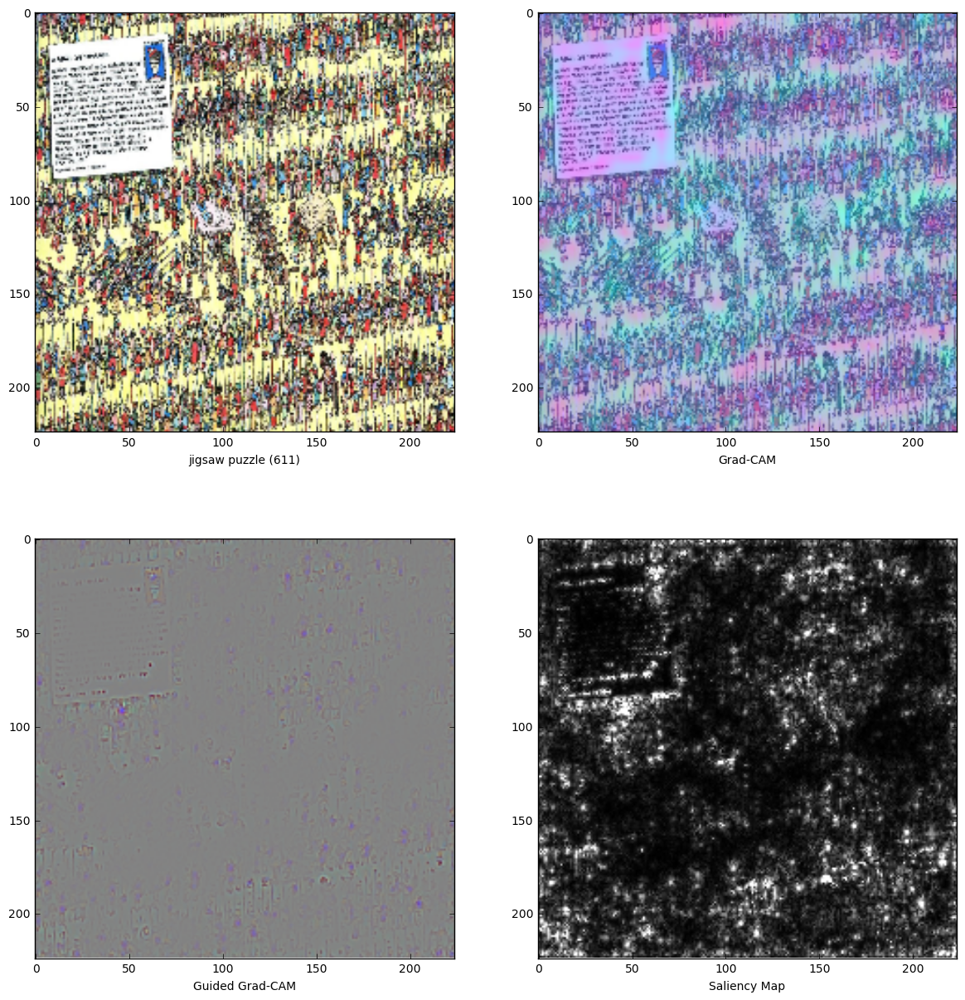

In [9]:
layer = network.features[14]._name
print(layer)

show_images(*visualize(network, "Deep-Waldo/data/original/10.jpg", layer))

**Showing the last layer's visualizations**

vgg0_conv2d12


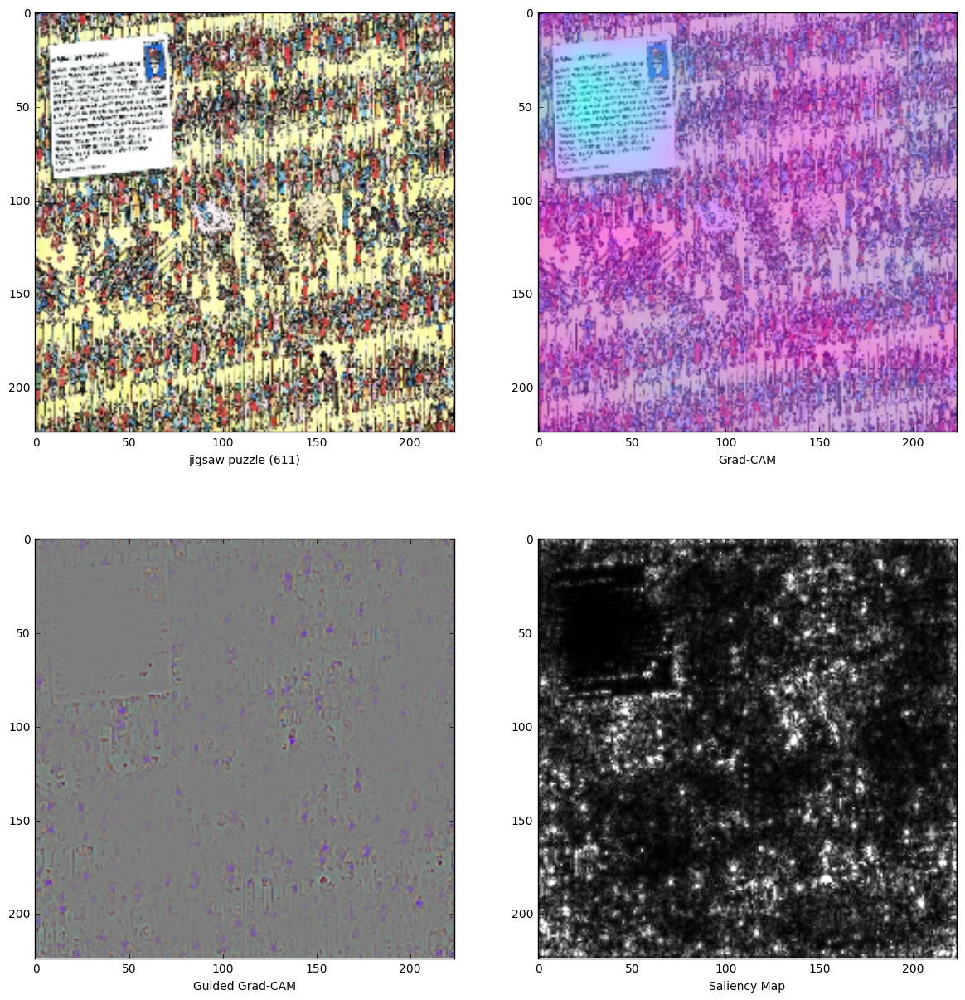

In [10]:
layer = network.features[28]._name
print(layer)

show_images(*visualize(network, "Deep-Waldo/data/original/10.jpg", layer))

**First**

vgg0_conv2d0


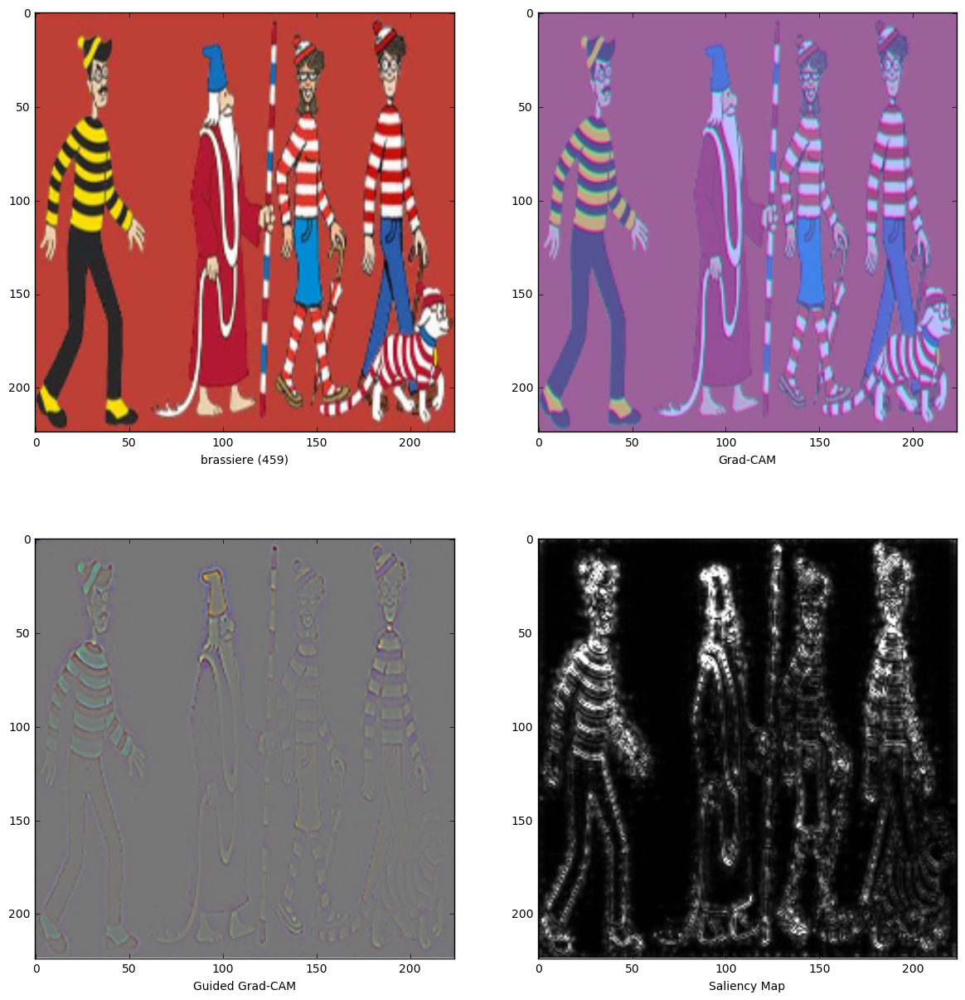

In [11]:
layer = network.features[0]._name
print(layer)
show_images(*visualize(network, "Deep-Waldo/data/original/30.jpg", layer))

**Second**

vgg0_conv2d6


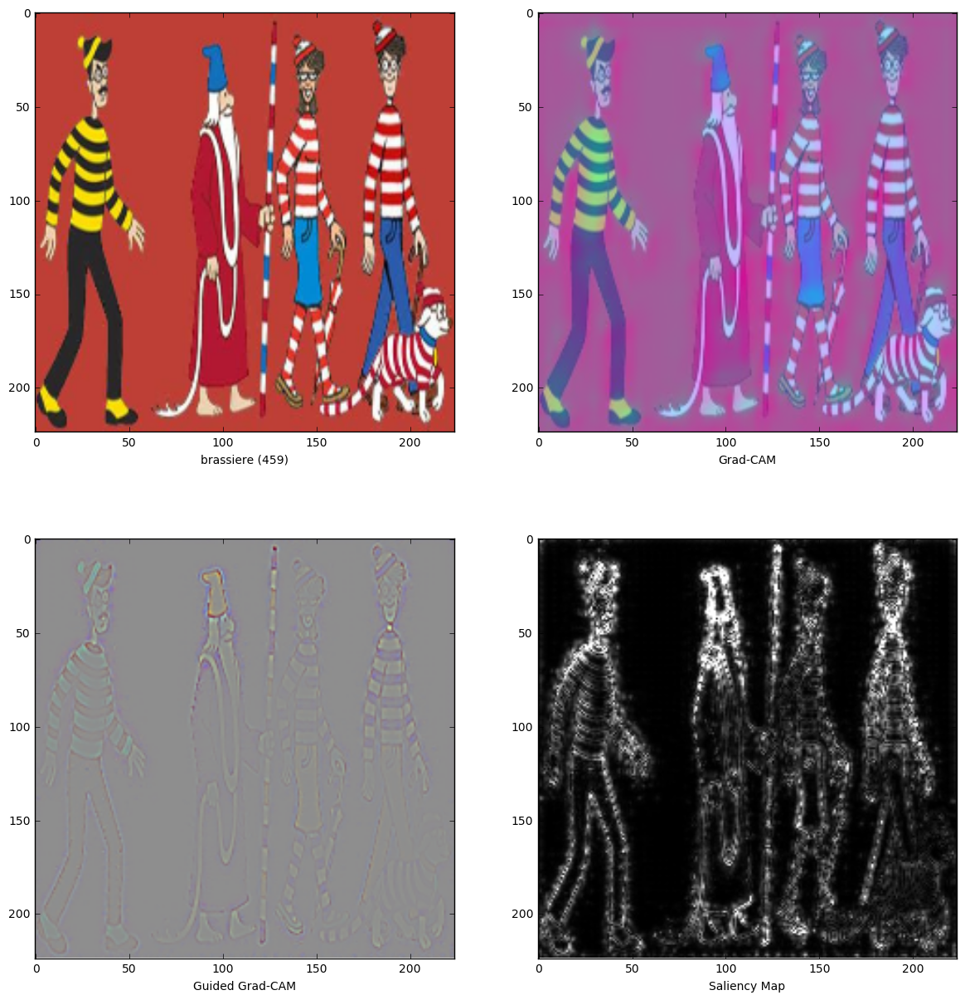

In [12]:
layer = network.features[14]._name
print(layer)
show_images(*visualize(network, "Deep-Waldo/data/original/30.jpg", layer))

**Third**

vgg0_conv2d12


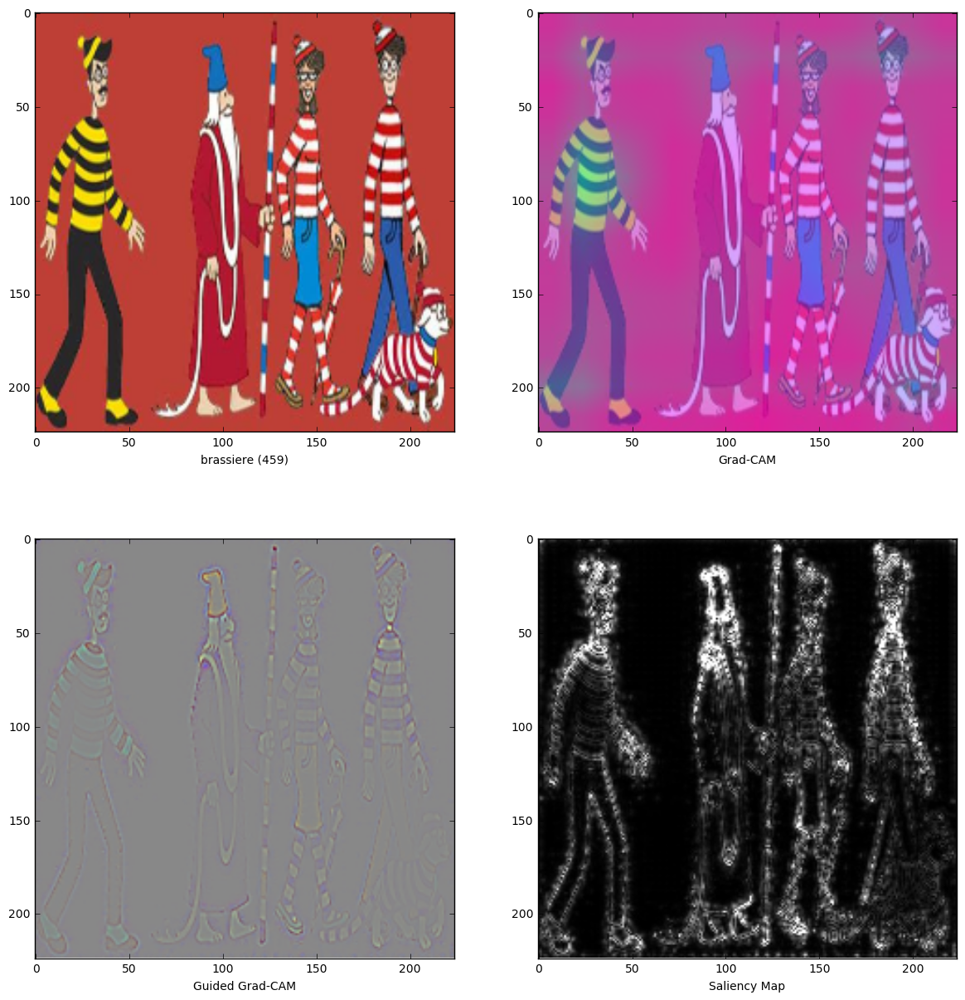

In [72]:
layer = network.features[28]._name
print(layer)
show_images(*visualize(network, "Deep-Waldo/data/original/30.jpg", layer))

In [73]:
network.features[28]

Conv2D(
  (conv): Conv2D(512 -> 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

**SSD Last Layer**

yolov33_yolodetectionblockv32_conv4


/home/exampletestaccount1/waldo/gradcam.py:217: RuntimeWarning: invalid value encountered in true_divide
  cam = (cam - np.min(cam)) / (np.max(cam) - np.min(cam))
/home/exampletestaccount1/waldo/gradcam.py:204: RuntimeWarning: invalid value encountered in true_divide
  gradient /= gradient.max()
/home/exampletestaccount1/waldo/gradcam.py:242: RuntimeWarning: invalid value encountered in true_divide
  grayscale_im = np.clip((grayscale_im - im_min) / (im_max - im_min), 0, 1)


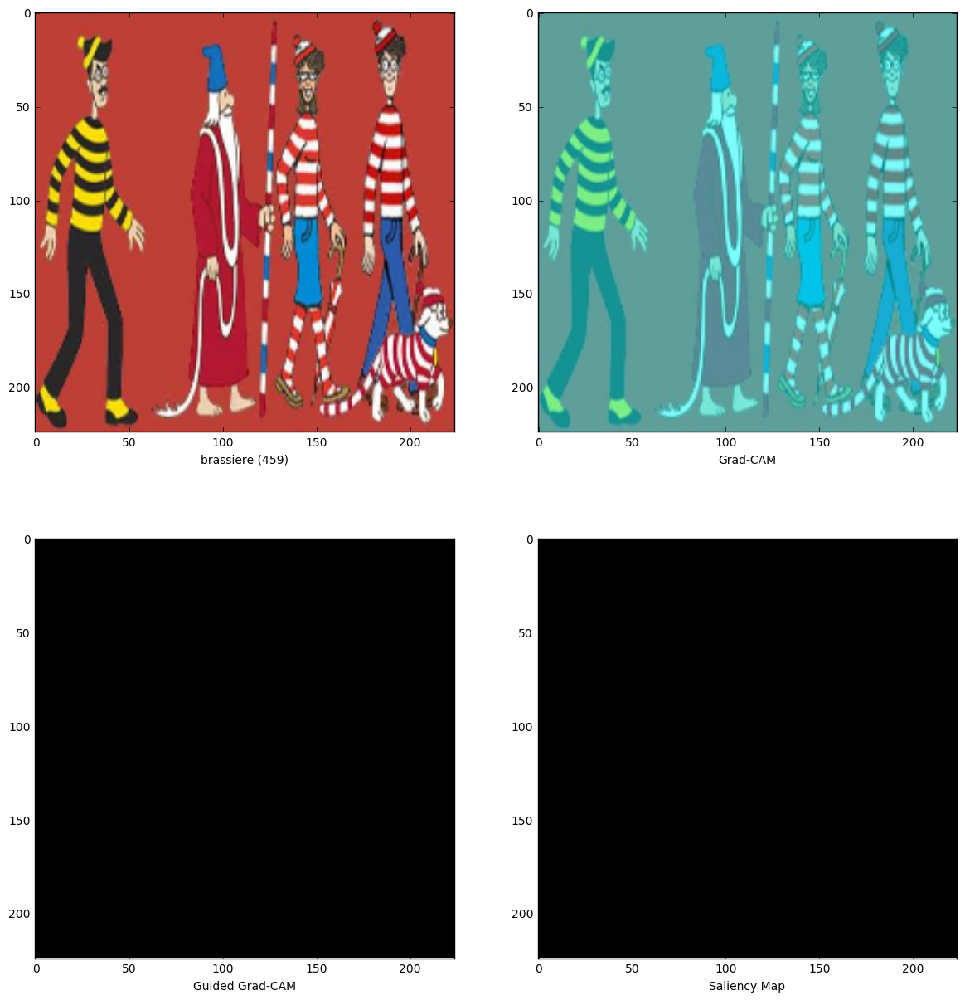

In [68]:
import gluoncv as gcv
# net = gcv.model_zoo.get_model('ssd_512_mobilenet1.0_custom', classes=['Waldo'], pretrained_base=False)
# net.load_parameters('./model/ssd_waldo_sd_sb.params', ctx=mx.gpu())
net = gcv.model_zoo.get_model('yolo3_darknet53_voc', pretrained=True)

layer = net.yolo_blocks[2].body[4][0]._name
print(layer)
show_images(*visualize(network, "Deep-Waldo/data/original/30.jpg", layer))

In [71]:
net.yolo_blocks[2].body[4][0]

Conv2D(256 -> 128, kernel_size=(1, 1), stride=(1, 1), bias=False)